In [86]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import os 
import random 
import warnings
from tensorflow.keras.preprocessing.image import load_img 

warnings.filterwarnings("ignore")

## create a datafream for input and output


In [87]:
input_part = []
label = []

for class_name in os.listdir("petImages"):
    for path in os.listdir("petImages/"+class_name): 
        if class_name == 'Cat':
            label.append(0)
        elif class_name == 'Dog':
            label.append(1)
        else :
            continue 
        input_part.append(os.path.join("petImages", class_name, path))

if input_part and label:
    print(input_part[0], label[0])
else:
    print("no data in  input_part or any label")

petImages\Cat\0.jpg 0


## show the dataframe

In [88]:
df = pd.DataFrame()
df['images'] = input_part
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()


,images,label
0,petImages\Cat\2867.jpg,0
1,petImages\Dog\3379.jpg,1
2,petImages\Dog\2975.jpg,1
3,petImages\Cat\1167.jpg,0
4,petImages\Cat\12205.jpg,0


#delete db files

In [89]:
for i in df['images']:
    if '.jpg' not in i :
        print (i)

petImages\Dog\Thumbs.db
petImages\Cat\Thumbs.db


In [90]:
import PIL
import PIL.Image
I = []
for image in df ['images']:
    try :
        img = PIL.Image.open(image)
    except :
        I.append(image)

I

['petImages\\Dog\\11702.jpg',
 'petImages\\Cat\\666.jpg',
 'petImages\\Dog\\Thumbs.db',
 'petImages\\Cat\\Thumbs.db']

In [91]:
df = df[df['images']!='petImages\Cat\Thumbs.db']
df = df[df['images']!='petImages\Dog\Thumbs.db']
df = df[df['images']!='petImages\Dog\11702.jpg']
df = df[df['images']!='petImages\Cat\666.jpg']
len(df)

25000

## explorstory data anylysis
#dog
#display grid of images

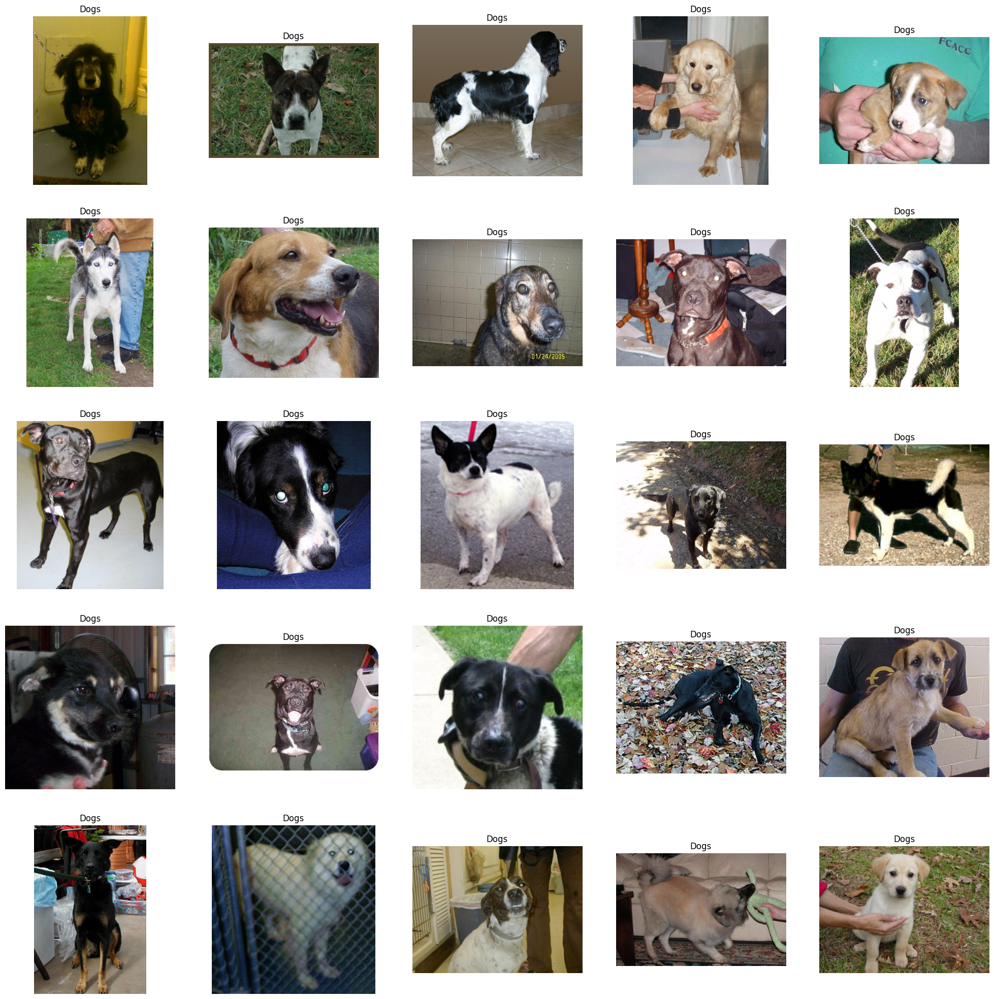

In [92]:
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0,len(temp))
files = temp[start:start+25]


for index,file in enumerate(files):
    plt.subplot(5,5,index+1)
    img = load_img(file)
    img = np.array(img)
    plt .imshow(img)
    plt.title('Dogs')
    plt.axis('off')

# cat 

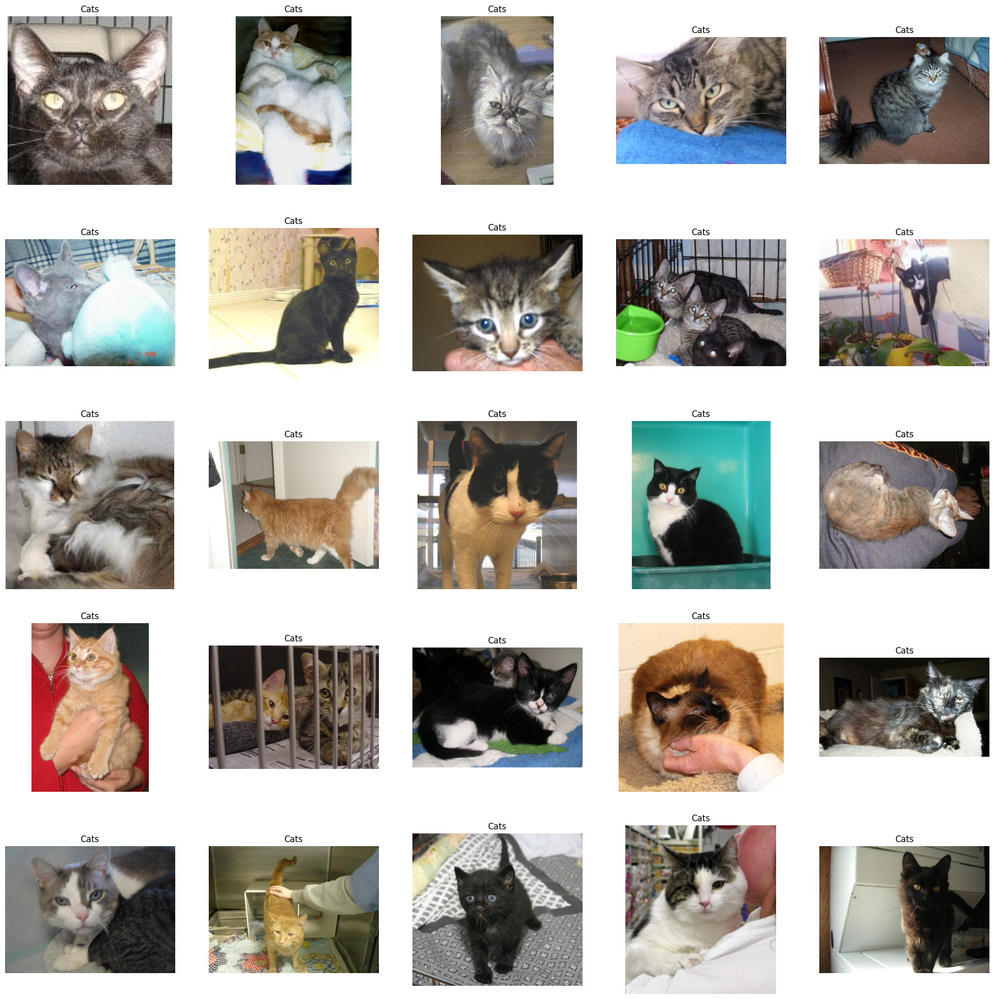

In [93]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0,len(temp))
files = temp[start:start+25]


for index,file in enumerate(files):
    plt.subplot(5,5,index+1)
    img = load_img(file)
    img = np.array(img)
    plt .imshow(img)
    plt.title('Cats')
    plt.axis('off')

<Axes: ylabel='count'>

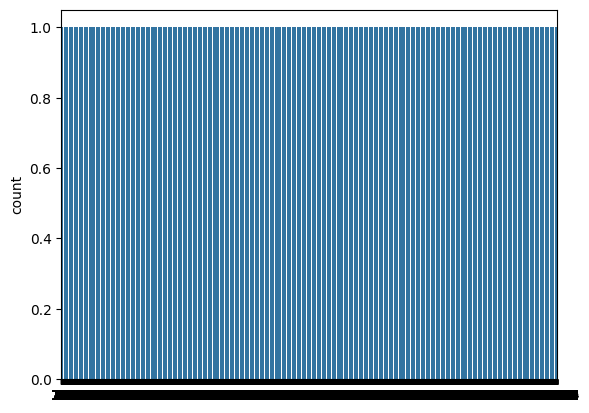

In [94]:
import seaborn as sns 
sns.countplot(df['label'])

In [95]:
print(df['label'].value_counts())

label
0    12500
1    12500
Name: count, dtype: int64


Create DataGenerator for the Images 

In [96]:
df['label']=df['label'].astype('str')

In [97]:
from PIL import Image

def is_valid_image(path):
    try:
        img = Image.open(path)
        img.verify()  # เช็กว่าเปิดและไม่เสีย
        return True
    except:
        return False

# ล้าง dataframe
df = df[df['images'].apply(is_valid_image)].reset_index(drop=True)
print("a pic after clean :", len(df))

a pic after clean : 24998


In [98]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [99]:
test.head()

,images,label
6868,petImages\Cat\7612.jpg,0
22910,petImages\Dog\11908.jpg,1
9668,petImages\Dog\10162.jpg,1
13638,petImages\Cat\2042.jpg,0
23337,petImages\Dog\6599.jpg,1


In [100]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 32 

train_generator = ImageDataGenerator(
    rescale=1./255,  # normalization of images
    rotation_range=40,  # augmentation of images to avoid overfitting
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest' 
    )

val_generator = ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size = (128,128),
    batch_size = 32   , ## can change size upto your computer (64/128/512 )
    class_mode = 'binary',
    validate_filenames=False
    )

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size = (128,128),
    batch_size = 32   , ## can change size upto your computer (64/128/512 )
    class_mode = 'binary',
    validate_filenames=False
    )



Found 19998 non-validated image filenames belonging to 2 classes.
Found 5000 non-validated image filenames belonging to 2 classes.


Model creation 

In [101]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

## make a model 

model = Sequential([
    Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)), ## 1st layer
    MaxPooling2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPooling2D((2,2)),
    Conv2D(64,(3,3),activation='relu'),
    MaxPooling2D((2,2)),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')
])


In [102]:
## compile the model 

model.compile(optimizer = 'adam',loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [114]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

history = model.fit(
    train_iterator,
    epochs = 5  ,
    validation_data = val_iterator
)
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_iterator,
    epochs=20, # as  much as u can because it will stop by it self
    validation_data=val_iterator,
    callbacks=[early_stop]       # it will stop here
)

Epoch 1/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 75s 120ms/step - accuracy: 0.8634 - loss: 0.3170 - val_accuracy: 0.8076 - val_loss: 0.4697
Epoch 2/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 76s 121ms/step - accuracy: 0.8701 - loss: 0.3016 - val_accuracy: 0.8762 - val_loss: 0.3057
Epoch 3/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 76s 121ms/step - accuracy: 0.8732 - loss: 0.2894 - val_accuracy: 0.8714 - val_loss: 0.2934
Epoch 4/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 76s 122ms/step - accuracy: 0.8704 - loss: 0.2908 - val_accuracy: 0.8800 - val_loss: 0.2859
Epoch 5/5
625/625 ━━━━━━━━━━━━━━━━━━━━ 77s 123ms/step - accuracy: 0.8799 - loss: 0.2823 - val_accuracy: 0.8718 - val_loss: 0.2911
Epoch 1/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 84s 132ms/step - accuracy: 0.8839 - loss: 0.2713 - val_accuracy: 0.8816 - val_loss: 0.2807
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 79s 126ms/step - accuracy: 0.8885 - loss: 0.2682 - val_accuracy: 0.8824 - val_loss: 0.2950
Epoch 3/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 76s 121ms/step - accuracy: 0.8848 - loss: 0.2682

Visualization of results

In [115]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1,len(acc)+1)


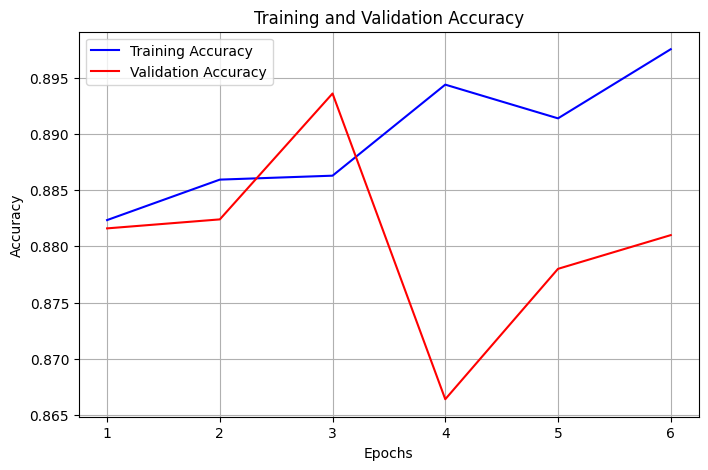

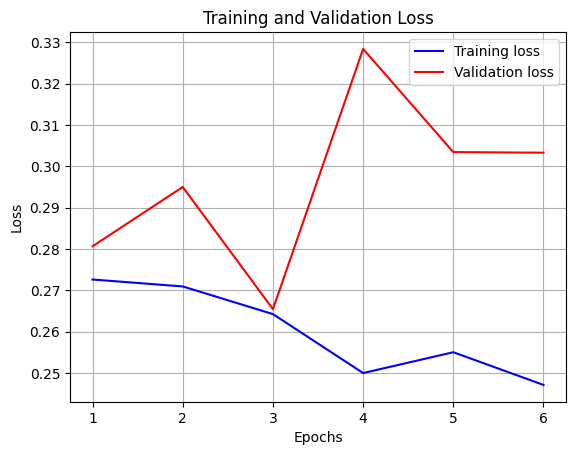

In [116]:
# Accuracy Graph
plt.figure(figsize=(8,5))
plt.plot(epochs,acc,'b',label='Training Accuracy')
plt.plot(epochs,val_acc,'r',label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


# Loss Graph
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochs,loss,'b',label='Training loss')
plt.plot(epochs,val_loss,'r',label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [118]:
loss, acc = model.evaluate(val_iterator)
print(f"Validation Loss: {loss:.4f}")
print(f"Validation Accuracy: {acc:.4f}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - accuracy: 0.8924 - loss: 0.2640
Validation Loss: 0.2654
Validation Accuracy: 0.8936


checking the model by Confusion_matrix , Classification report 

157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step


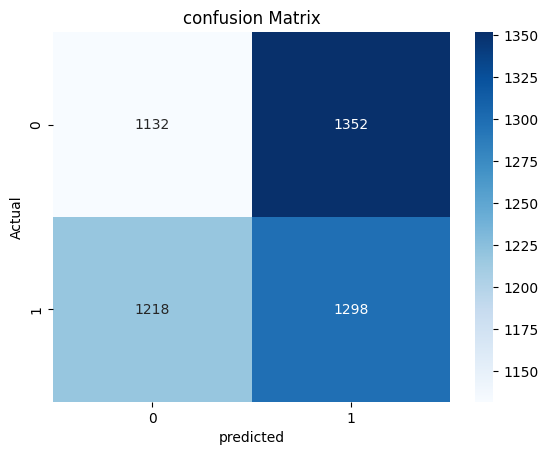

              precision    recall  f1-score   support

           0       0.48      0.46      0.47      2484
           1       0.49      0.52      0.50      2516

    accuracy                           0.49      5000
   macro avg       0.49      0.49      0.49      5000
weighted avg       0.49      0.49      0.49      5000



In [119]:
from sklearn.metrics import confusion_matrix,classification_report
import seaborn as sns 
import matplotlib.pyplot as plt

test.reset_index(drop=True , inplace=True)
y_true = test ['label'].astype('int')

y_pred = model.predict(val_iterator)
y_pred = (y_pred > 0.5).astype('int').reshape(-1)

cm = confusion_matrix(y_true,y_pred)
sns.heatmap(cm,annot=True,fmt='d',cmap='Blues')
plt.xlabel("predicted")
plt.ylabel("Actual")
plt.title("confusion Matrix")
plt.show()

print(classification_report(y_true,y_pred))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


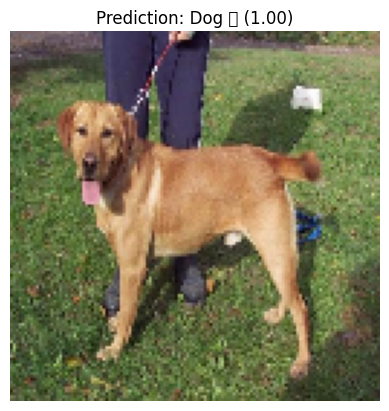

In [123]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# 🔸 ฟังก์ชันช่วยโหลดภาพและทำนาย
def predict_and_show(image_path):
    img = load_img(image_path, target_size=(128, 128))
    img_array = img_to_array(img) / 255.0  # normalize
    img_array = np.expand_dims(img_array, axis=0)  # เพิ่ม batch dimension

    prediction = model.predict(img_array)
    label = "Dog 🐶" if prediction[0][0] > 0.5 else "Cat 🐱"
    
    plt.imshow(img)
    plt.title(f"Prediction: {label} ({prediction[0][0]:.2f})")
    plt.axis('off')
    plt.show()

# 🔸 ลองทำนายภาพใหม่
predict_and_show("petImages/Dog/1005.jpg") 